### Installing required libraries

In [1]:
pip install pillow


Note: you may need to restart the kernel to use updated packages.


In [6]:
pip install requests

Note: you may need to restart the kernel to use updated packages.


### Importing/downloading images

In [6]:
#image 1 = lenna.png
import requests 
url = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png"
response = requests.get(url)
with open("lenna.png", "wb") as file:
    file.write(response.content)

In [7]:
#image 2 = baboon.png
import requests 
url = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png"
response = requests.get(url)
with open("baboon.png", "wb") as file:
    file.write(response.content)

In [8]:
#image 3 = barbara.png
import requests 
url = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/barbara.png"
response = requests.get(url)
with open("barbara.png", "wb") as file:
    file.write(response.content)

Helper function to concatenate two images side-by-side

In [17]:
def get_concat_h(im1, im2):
    #https://note.nkmk.me/en/python-pillow-concat-images/
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst

### Image files and paths

In [56]:
my_image = "lenna.png"

Paths to the currect working directory using os module

In [19]:
import os
cwd = os.getcwd()
cwd 

'C:\\Users\\hp\\Desktop\\DSAI\\Computer Vision'

Path to the Image

In [57]:
image_path1 = os.path.join(cwd, my_image)
image_path1

'C:\\Users\\hp\\Desktop\\DSAI\\Computer Vision\\lenna.png'

In [ ]:
### Loading Images in python through (PIL) library 

In [58]:
from PIL import Image

In [121]:
image1 = Image.open(my_image)
type(image1)

PIL.PngImagePlugin.PngImageFile

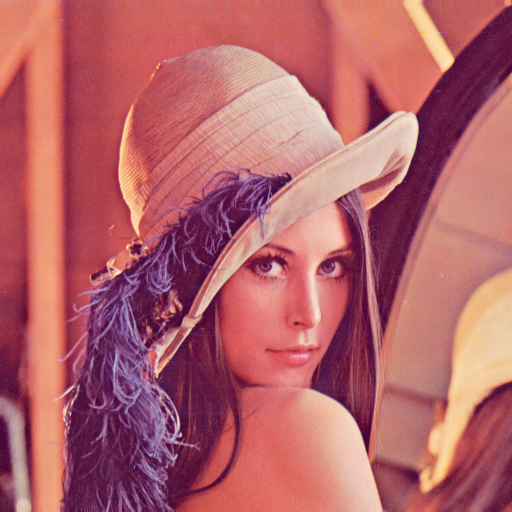

In [122]:
image1

alternatively use matplotlib to show image

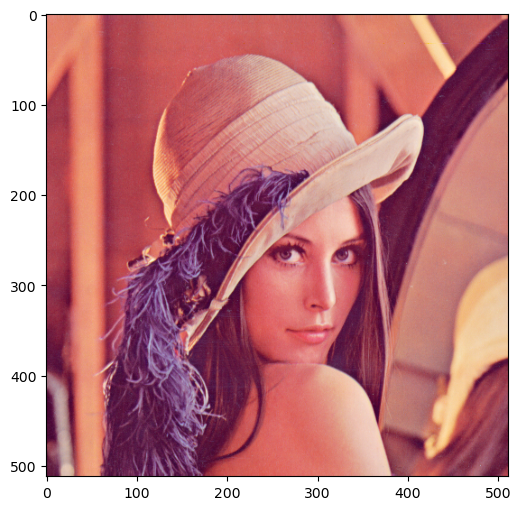

In [123]:
import matplotlib.pyplot as plt
plt.figure(figsize=(6,6))
plt.imshow(image1)
plt.show()

In [25]:
my_image2 = "baboon.png"

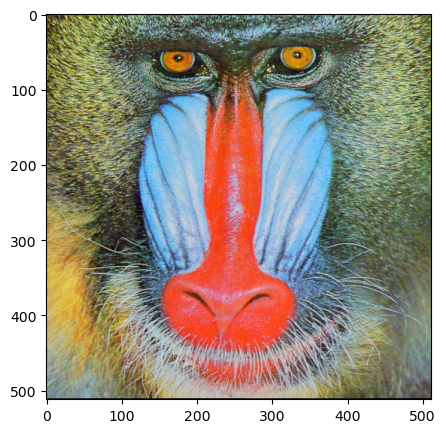

In [124]:
image_path2 = os.path.join(cwd, my_image2)
image_path2
image2 = Image.open(my_image2)
type(image2)
plt.figure(figsize=(5,5))
plt.imshow(image2)
plt.show()

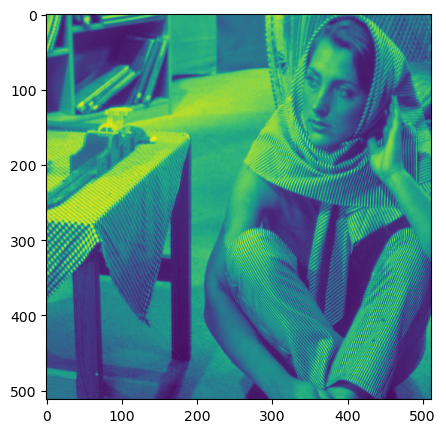

In [125]:
my_image3 = "barbara.png"
image_path3 = os.path.join(cwd, my_image2)
image_path3
image3 = Image.open(my_image3)
type(image3)
plt.figure(figsize=(5,5))
plt.imshow(image3)
plt.show()

### Grayscale Images, Quantization and Color Channels


In [41]:
image_gray.mode

'L'

In [97]:
image_gray.size

(512, 512)

In [126]:
im = image1.load() 
im

In [101]:
x = 0
y = 1
im[y,x]

(63, 57, 31)

Save the image

In [127]:
image.save("lenna.jpg")

### Grayscale Images, Quantization and Color Channels

### 1. Grayscale Images

In [114]:
from PIL import ImageOps 

In [115]:
image_gray.mode

'L'

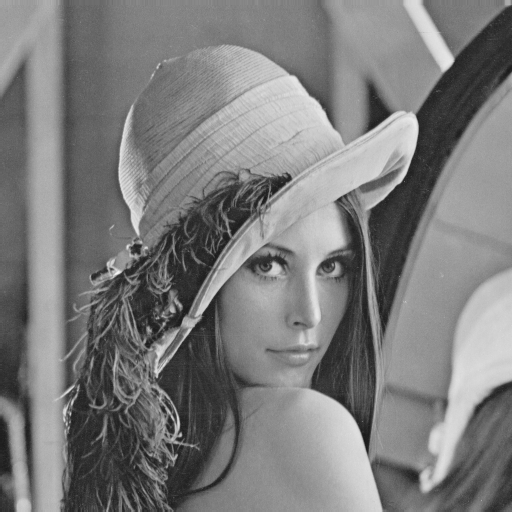

In [129]:
image_gray = ImageOps.grayscale(image1) 
image_gray 

### 2. Quantization
for grayscale images quantization means different shades of gray
using quantize function to decrease te levels

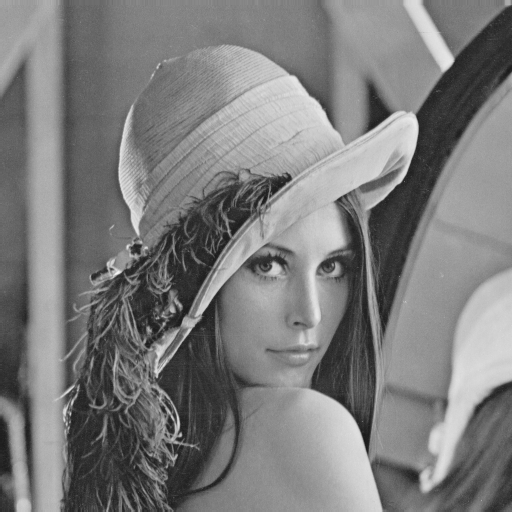

In [130]:
# half the levels
image_gray.quantize(256 // 2)
image_gray

function to continue dividing the number of values by two and compare it to the original image.

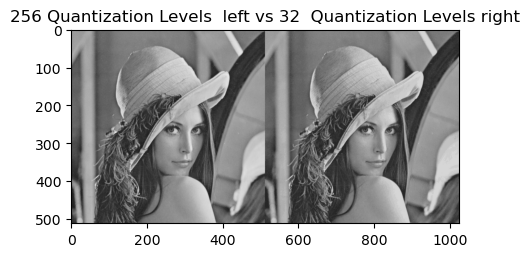

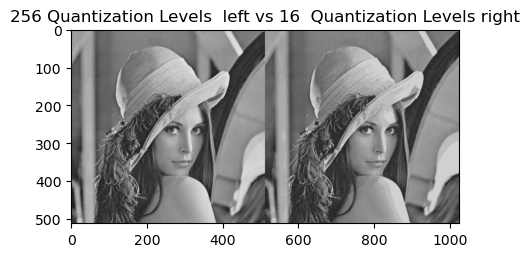

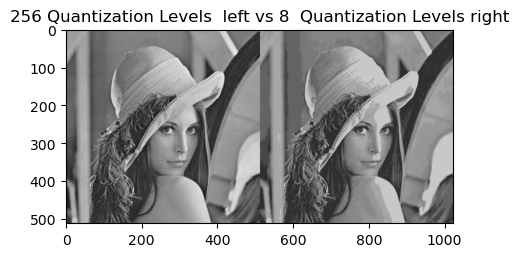

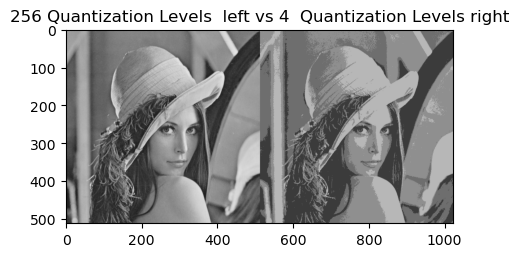

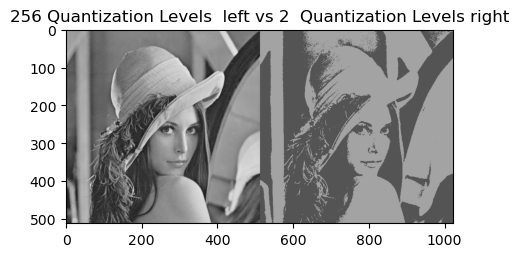

In [131]:
#get_concat_h(image_gray,  image_gray.quantize(256//2)).show(title="Lena") 
for n in range(3,8):
    plt.figure(figsize=(5,5))

    plt.imshow(get_concat_h(image_gray,  image_gray.quantize(256//2**n))) 
    plt.title("256 Quantization Levels  left vs {}  Quantization Levels right".format(256//2**n))
    plt.show()

### 3. Color channels

Working with different color channels

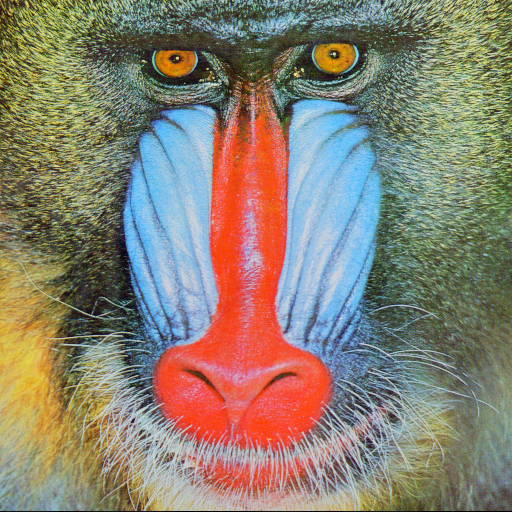

In [132]:
baboon = Image.open('baboon.png')
baboon

In [133]:
red, green, blue = baboon.split()

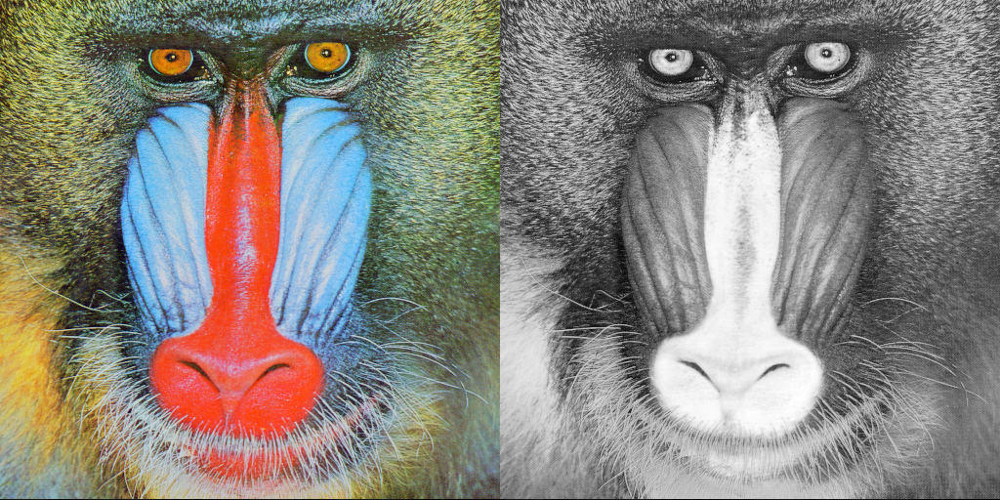

In [134]:
get_concat_h(baboon, red)

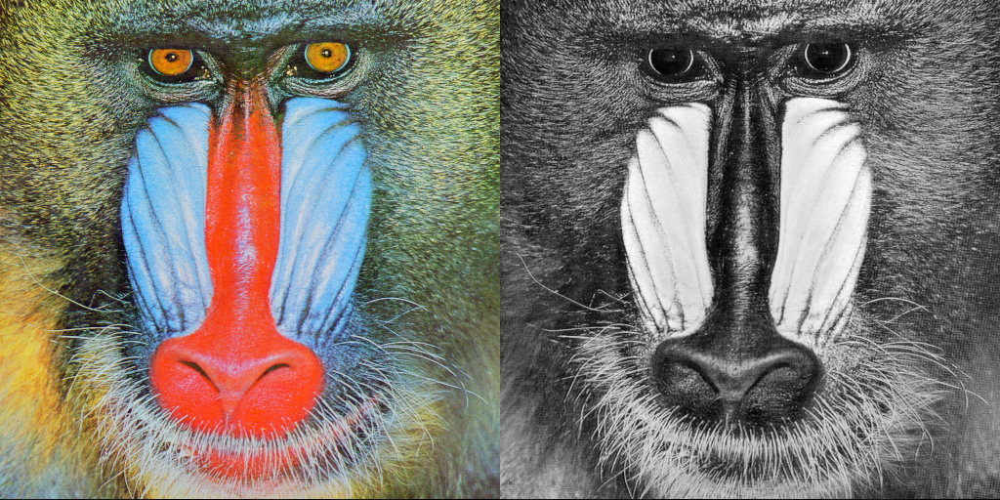

In [135]:
get_concat_h(baboon, blue)

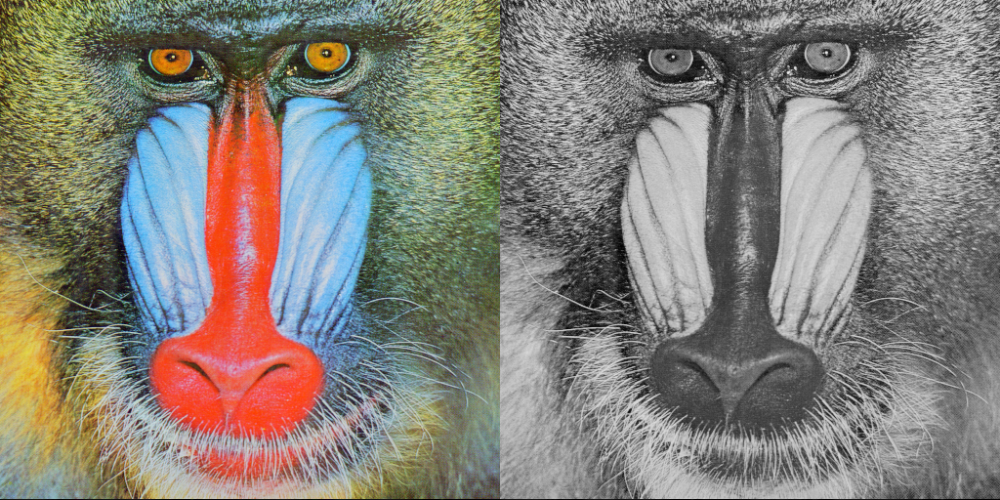

In [136]:
get_concat_h(baboon, green)

### PIL Images into NumPy Arrays

NumPy is a library for Python, allowing you to work with multi-dimensional arrays and matrices. We can convert a PIL image to a NumPy array. We use <code>asarray()</code> or <code>array</code> function from NumPy to convert PIL images into NumPy arrays. 

First, let's import the numpy module:


In [140]:
import numpy as np
array= np.asarray(image1)
print(type(array))

<class 'numpy.ndarray'>


In [141]:
array = np.array(image1)

In [142]:
# rows, columns, color channels
print(array.shape)

(512, 512, 3)


In [78]:
print(array)


[[[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 [[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 [[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 ...

 [[ 84  18  60]
  [ 84  18  60]
  [ 92  27  58]
  ...
  [173  73  84]
  [172  68  76]
  [177  62  79]]

 [[ 82  22  57]
  [ 82  22  57]
  [ 96  32  62]
  ...
  [179  70  79]
  [181  71  81]
  [185  74  81]]

 [[ 82  22  57]
  [ 82  22  57]
  [ 96  32  62]
  ...
  [179  70  79]
  [181  71  81]
  [185  74  81]]]


In [143]:
array[0, 0]


array([226, 137, 125], dtype=uint8)

In [144]:
array.min()


3

In [145]:
array.max()

255

### Indexing

plotting the array as an image:

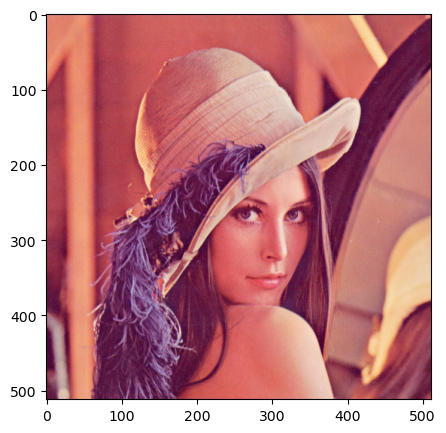

In [148]:
plt.figure(figsize=(5,5))
plt.imshow(array)
plt.show()

In [84]:
rows = 256

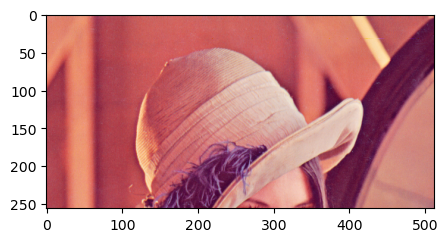

In [149]:
plt.figure(figsize=(5,5))
plt.imshow(array[0:rows,:,:])
plt.show()

In [87]:
columns = 256

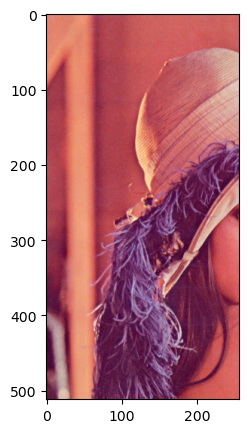

In [152]:
plt.figure(figsize=(5,5))
plt.imshow(array[:,0:columns,:])
plt.show()

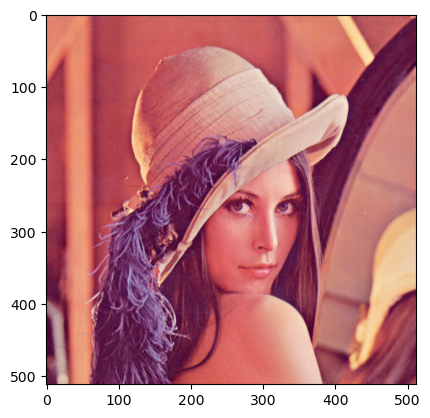

In [153]:
# reassigning array to another variable (reassign a copy here)
A = array.copy()
plt.imshow(A)
plt.show()

We can also work with the different color channels. Consider the baboon image: 

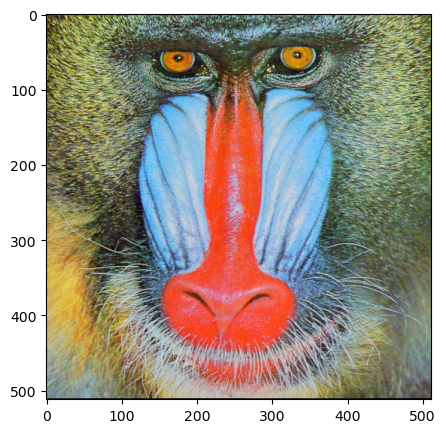

In [154]:
baboon_array = np.array(baboon)
plt.figure(figsize=(5,5))
plt.imshow(baboon_array)
plt.show()

We can plot the red channel as intensity values of the red channel.

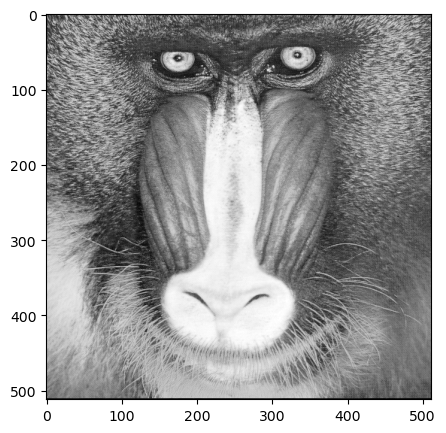

In [157]:
baboon_array = np.array(baboon)
plt.figure(figsize=(5,5))
plt.imshow(baboon_array[:,:,0], cmap='gray')
plt.show()

Or we can create a new array and set all but the red color channels to zero. Therefore, when we display the image it appears red:

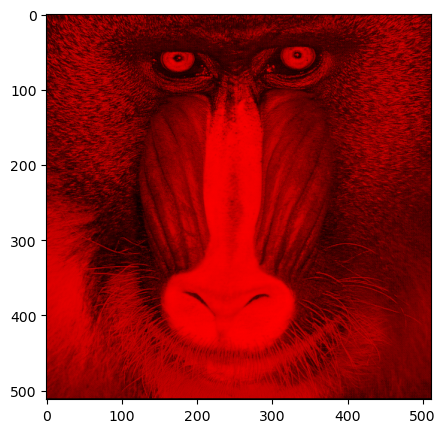

In [159]:
baboon_red=baboon_array.copy()
baboon_red[:,:,1] = 0
baboon_red[:,:,2] = 0
plt.figure(figsize=(5,5))
plt.imshow(baboon_red)
plt.show()

We can do the same for blue:

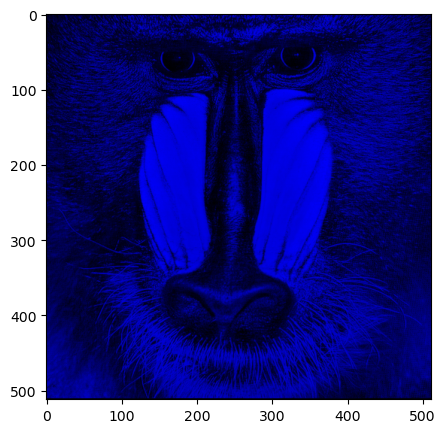

In [161]:
baboon_blue=baboon_array.copy()
baboon_blue[:,:,0] = 0
baboon_blue[:,:,1] = 0
plt.figure(figsize=(5,5))
plt.imshow(baboon_blue)
plt.show()

### Doing the same steps for lenna.png

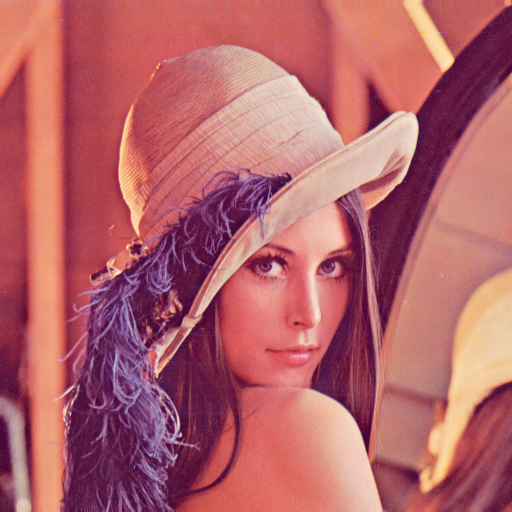

In [162]:
lenna = Image.open('lenna.png')
lenna

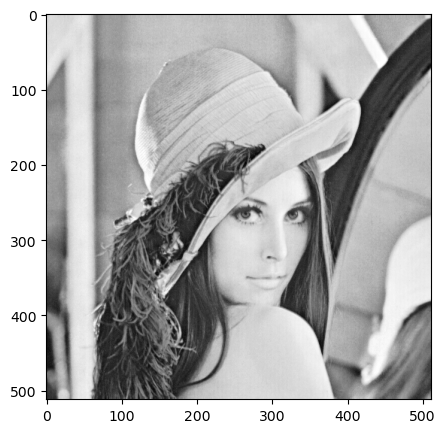

In [163]:
lenna_array = np.array(lenna)
plt.figure(figsize=(5,5))
plt.imshow(lenna_array[:,:,0], cmap='gray')
plt.show()

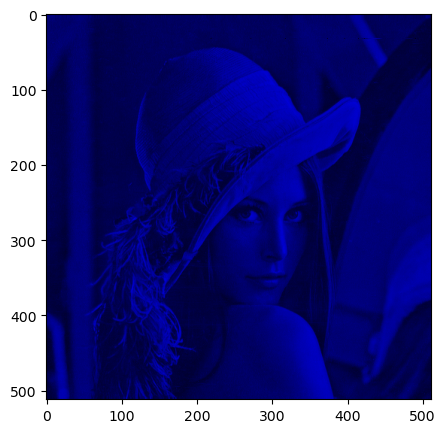

In [164]:
lenna_blue=lenna_array.copy()
lenna_blue[:,:,0] = 0
lenna_blue[:,:,1] = 0
plt.figure(figsize=(5,5))
plt.imshow(lenna_blue)
plt.show()

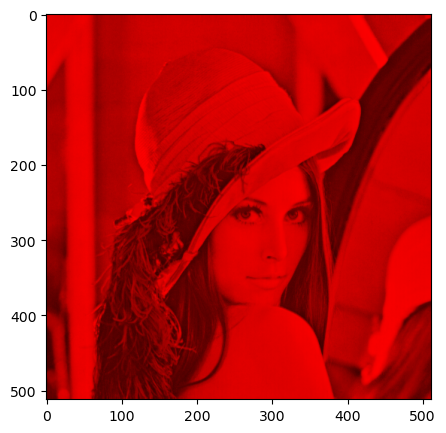

In [165]:
lenna_red=lenna_array.copy()
lenna_red[:,:,1] = 0
lenna_red[:,:,2] = 0
plt.figure(figsize=(5,5))
plt.imshow(lenna_red)
plt.show()